<a href="https://colab.research.google.com/github/amir-asari/SEBB4083-Assignment2023/blob/main/MiniProject-Proper_VS_Unproper_(Open_Nose_%2B_Without_mask)_80_20_Group_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mini Project 2023 (Facemask: Proper VS Unproper)
### Total marks: 30

### Group No.:

###Group Members:
1) Kaviarasu A/L Nandaguru (A19EB0015)

2) Chee Pui Khei (A19EB0063)

3) Joyce Lim Xin Yee (A19EB0065)

4) Asim Ahmed Ibrahim (A19EB5111)

5) Sherina Sree Nair A/P Sasidaran (A19EB5284)

## Chapter 1: Introduction

###1.1 Background of study and related works




The utilization of face masks has become a fundamental preventative measure amidst the COVID-19 pandemic. It is of utmost importance that the proper implementation of face masks, including the coverage of both the nose and mouth, is exercised in order to mitigate the risk of COVID-19 virus transmission. However, there may exist certain instances wherein individuals neglect to adhere to the recommended guidelines, leading to erroneous application of masks.

CNNs are a subset of deep learning neural networks that are particularly adept at processing visual data, including pictures and videos [1]. They are excellent for the detection of face masks in pictures or videos because of their suitability for image classification tasks. CNNs are able to recognise and categorise various types of mask usage because they can learn intricate patterns and characteristics directly from the unprocessed pixel data [2].

The labelled images are often sent into the CNN during training so it can make predictions about the mask usage class. Through a procedure known as backpropagation, the network modifies its internal parameters by comparing the predictions to the ground truth labels [3]. This iterative procedure keeps going until CNN classifies mask usage with a degree of accuracy that is adequate.

Numerous studies have delved into the use of CNNs for the purpose of image categorization, such as face mask detection. These studies have substantiated the effectiveness of transfer learning, a technique that capitalizes on pre-existing models, in achieving precision regarding classification outcomes. Firstly, Singh et al. employed the YOLOv3 and faster R-CNN object detection models, which were trained on a dataset comprising images of individuals donning and not donning face masks. These models successfully delineated bounding boxes around the faces of persons and categorized them based on their utilization of masks [4].

Furthermore, a paper published on IEEE expounds a methodology founded on the CNN-based approach for detecting face masks. It utilized TensorFlow, Keras, OpenCV, and Scikit-Learn to create a system that can identify faces and ascertain if they are not wearing masks [3]. The proposed technique has yielded an impressive degree of accuracy when it comes to discerning masks in both images and videos [3]. Additionally, Kaur et al. made use of TensorFlow, Keras, OpenCV, and Scikit-Learn to construct a system that recognizes face masks. Their approach involved training a CNN model on images and videos for the precise identification of face masks [2]. Moreover, Hussain et al. proposes a deep learning-based automatic face mask detection system. To get precise categorization findings, they used transfer learning using MobileNetV2, a model that had already been trained to look for face masks in public settings in an effort to lower the danger of Covid-19 transmission [1].

Overall, the project focuses on the development of a Convolutional Neural Network (CNN) classifier, specifically designed to identify the proper and improper usage of face masks based on the images provided, specifically targeting cases where the nose is open or no mask is worn.

###1.2 Objectives

The main objectives of this project are as follows:

1.   To develop a CNN classifier using transfer learning with the VGG16 model to detect proper and improper face mask usage.
2.   To evaluate the performance of the classifier using different training and testing data ratios (70:30, 80:20, 90:10).
3.  To compare the performance of the classifier with and without data augmentation.
4.  To investigate the effect of freezing parameters in different layers of the network by selectively freezing specific layers while training the remaining layers.
5.  To analyze and interpret the results, providing insights into the effectiveness and limitations of the proposed CNN classifier for face mask detection.


## Chapter 2: Methodology and Results




1) Setup by importing necessary libraries  for developing a Convolutional Neural Network (CNN) in Python.

In [ ]:
# Setup
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
import tensorflow as tf

from tensorflow.keras import layers, models
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile
from zipfile import ZipFile

ERROR: Could not find a version that satisfies the requirement zipfile (from versions: none)
ERROR: No matching distribution found for zipfile


2) Data preprocessing was performed by downloading data from google drive link provided. Then, the downloaded files will be unzipped.

In [ ]:
# Download data from gdrive link 1JLvdd9nTt1KDTqUbXFo8AdQHeK9PboCa
! gdown --id 1JLvdd9nTt1KDTqUbXFo8AdQHeK9PboCa

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1JLvdd9nTt1KDTqUbXFo8AdQHeK9PboCa
To: /content/DatasetG2.zip
100% 23.7M/23.7M [00:00<00:00, 182MB/s]


In [ ]:
# Unzip the downloaded file
with ZipFile('/content/DatasetG2.zip','r') as zipObj:
  zipObj.extractall()

3) Data will be loaded using Keras utility. Dataset will be created by defining some parameter for the ImageDataGenerator.

In [ ]:
# Create a dataset.Define some parameters for the ImageDataGenerator
batch_size = 50  # Of course here, we are using mini-batch gradient descent
img_height = 224
img_width = 224

4) Data was splitted into 80% training data and 20% testing data. After data was splitted successfully, all data will saved in folder named training_data and testing_data.

In [ ]:
# Define the path to your dataset directory
dataset_dir = '/content/DatasetG2'

# Define the path to the directory where you want to create the train and test folders
output_dir = '/content/output'

# Define the percentage of data to be used for testing
test_split = 0.2

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Delete train and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Create the subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['Properly Wear', 'Unproperly Wear']
/content/DatasetG2/Properly Wear/1623591266742.jpg
/content/output/train/Properly Wear/1623591266742.jpg
/content/DatasetG2/Properly Wear/1-2.jpg
/content/output/train/Properly Wear/1-2.jpg
/content/DatasetG2/Properly Wear/2-1 (2).jpg
/content/output/train/Properly Wear/2-1 (2).jpg
/content/DatasetG2/Properly Wear/6d1d98ac-7d27-4483-95aa-5472d62bce82.jpg
/content/output/train/Properly Wear/6d1d98ac-7d27-4483-95aa-5472d62bce82.jpg
/content/DatasetG2/Properly Wear/IMG20210611153617.jpg
/content/output/train/Properly Wear/IMG20210611153617.jpg
/content/DatasetG2/Properly Wear/Copy of photo6206331977737547098.jpg
/content/output/train/Properly Wear/Copy of photo6206331977737547098.jpg
/content/DatasetG2/Properly Wear/2-1 (5).jpg
/content/output/train/Properly Wear/2-1 (5).jpg
/content/DatasetG2/Properly Wear/2b8f89fe-8f51-49a6-bbce-87d707c93366.jpg
/content/output/train/Properly Wear/2b8f89fe-8f51-49a6-bbce-87d707c93366.jpg
/content/DatasetG2/Properly W

5) The path to the subfolder will be defined to store the images. There are total 4 subfolders such as: test_properly_wear_path, test_unproperly_wear_path, train_proper_wear_path, train_unproper_wear_path. Then, the number of images in each subfolder will be calculated and displayed accordingly.

In [ ]:
# Define the path to the subfolder containing the images
test_properly_wear_path = '/content/output/test/Properly Wear'
test_unproperly_wear_path = '/content/output/test/Unproperly Wear'
train_proper_wear_path = '/content/output/train/Properly Wear'
train_unproper_wear_path = '/content/output/train/Unproperly Wear'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(test_properly_wear_path) if os.path.isfile(os.path.join(test_properly_wear_path, name))])
num_images2 = len([name for name in os.listdir(test_unproperly_wear_path) if os.path.isfile(os.path.join(test_unproperly_wear_path, name))])
num_images3 = len([name for name in os.listdir(train_proper_wear_path) if os.path.isfile(os.path.join(train_proper_wear_path, name))])
num_images4 = len([name for name in os.listdir(train_unproper_wear_path) if os.path.isfile(os.path.join(train_unproper_wear_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/Properly Wear: {num_images1}")
print(f"Number of images in the test/Unproperly Wear: {num_images2}")
print(f"Number of images in the train/Properly Wear: {num_images3}")
print(f"Number of images in the train/Unproperly Wear: {num_images4}")

Number of images in the test/Properly Wear: 307
Number of images in the test/Unproperly Wear: 307
Number of images in the train/Properly Wear: 1227
Number of images in the train/Unproperly Wear: 1227


6) A tf.keras.preprocessing.image.ImageDataGenerator object was created to handle the image dataset for training and testing. Then, the object function flow_from_directory is used to provide batch of image dataset according to specification based on function input argument. Thus, 20% from the training data will be taken out and used as validation data.

In [ ]:
# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["Properly Wear" , "Unproperly Wear"] #make sure the spelling is similar to the folder name

# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 1964 images belonging to 2 classes.
Found 490 images belonging to 2 classes.
Found 614 images belonging to 2 classes.


## **Visualize the data**

7) The data was visualised by displaying the first nine images from the training dataset.

(50, 224, 224, 3)
(50,)


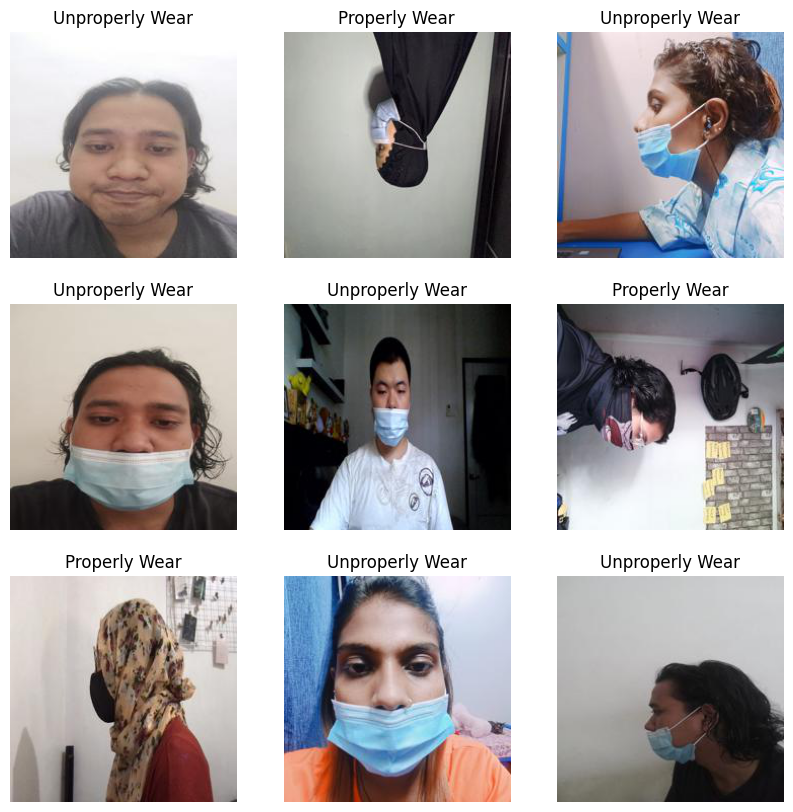

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

8) The base model from the pre-trained VGG16 was created by instantiate its pre-loadedwith weights trained on ImageNet. The figure of the base Model is shown.

In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxP

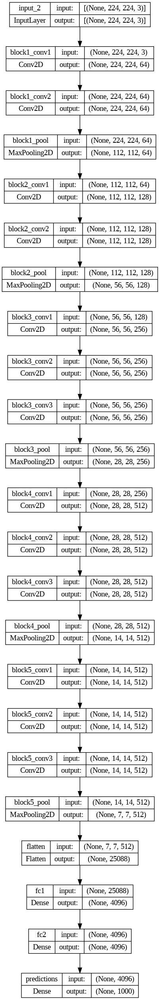

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

#  Without Augmentation

## except last layer

9) A model was created by copying from the 1st layer to the 2nd last layer

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

10) The existing weights was freezed.

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

**Compile the model**

11) The model was compiled before training it.* tf.keras.losses.BinaryCrossentropy loss with from_logits=True * was used as there are two classes and the model provides a linear output.

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

**Train the model without augmentation**

12) The model was trained without augmentation and with 5 epochs.



In [ ]:
history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

NameError: ignored

**Plot the learning curves**

13) The learning curves of the training and validation accuracy/loss when using the MobileNetV2 base model as a fixed feature extractor were plotted.

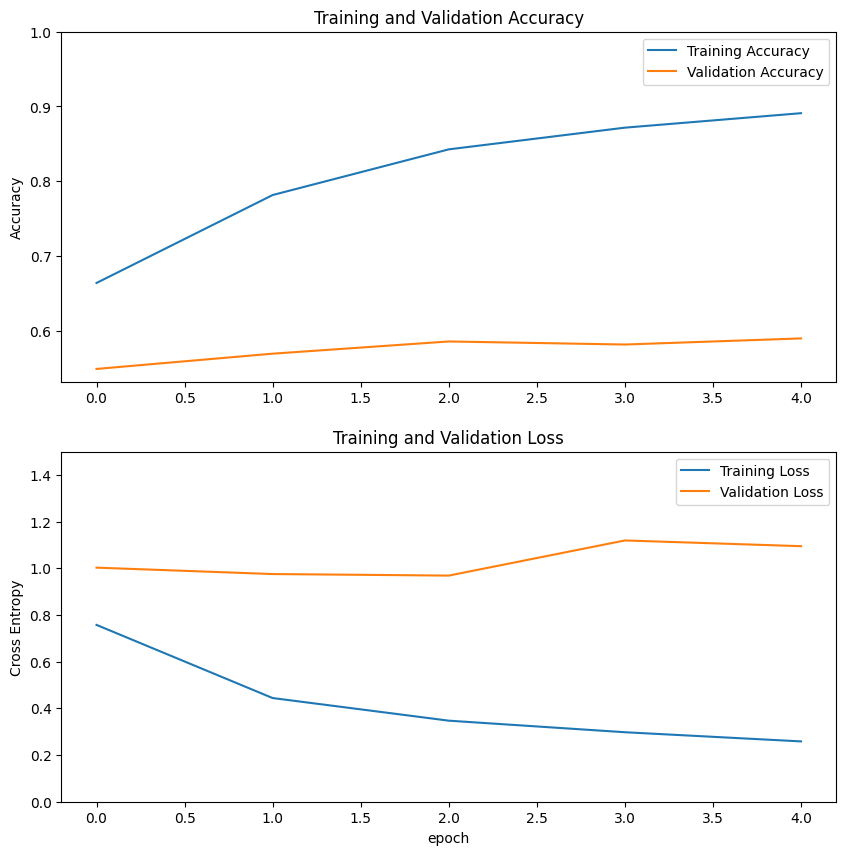

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.5])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Test the model**

14) The model was tested.

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

13/13 [==============================] - 3s 242ms/step - loss: 0.4483 - accuracy: 0.8127
Test accuracy: 0.8127036094665527


15) The developed model was tested again in several test images and visual the image, the predicted label, actual label and the probability (in %).

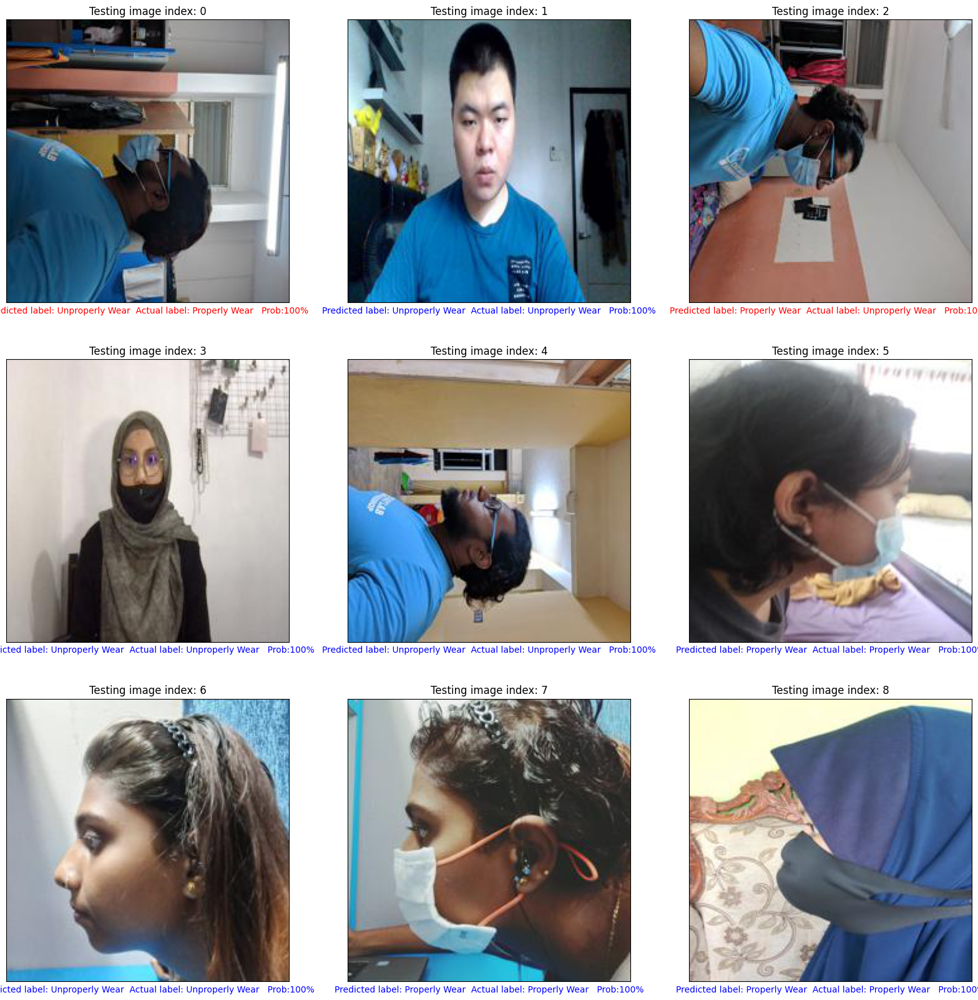

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(20, 20))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## without augmentation & except last 2 layer

16）A model was created by copying from the 1st layer to the 3rd last layer.

In [ ]:
#Create our model by copying from the 1st layer to the 3rd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

In [ ]:
#Freezing the existing weights
for layer in model.layers[0:-1]:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

**Compiling**

17) The data was then compiled for training.

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

**Train the model**

18) The data was trained with 5 epochs.


In [ ]:
history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

Epoch 1/5
40/40 [==============================] - 14s 311ms/step - loss: 0.8444 - accuracy: 0.6324 - val_loss: 0.9144 - val_accuracy: 0.5347
Epoch 2/5
40/40 [==============================] - 13s 310ms/step - loss: 0.5110 - accuracy: 0.7439 - val_loss: 0.9529 - val_accuracy: 0.5551
Epoch 3/5
40/40 [==============================] - 12s 305ms/step - loss: 0.3487 - accuracy: 0.8437 - val_loss: 0.9492 - val_accuracy: 0.5857
Epoch 4/5
40/40 [==============================] - 13s 313ms/step - loss: 0.3310 - accuracy: 0.8508 - val_loss: 1.0404 - val_accuracy: 0.5347
Epoch 5/5
40/40 [==============================] - 13s 334ms/step - loss: 0.2878 - accuracy: 0.8732 - val_loss: 1.0573 - val_accuracy: 0.5735


**Learning curves**

19) The learning curves were plotted by displaying graph of (a) training and validation accuracy (b) training and validation loss

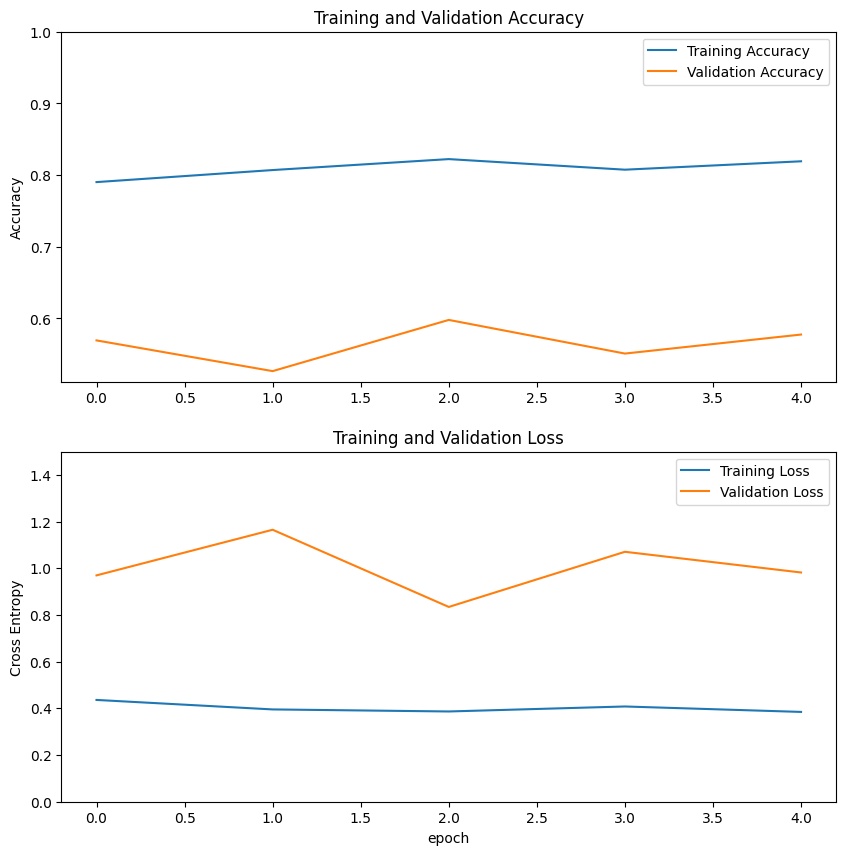

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.5])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Test the model**

20) The model was tested and the test accuracy was calculated and displayed.

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

13/13 [==============================] - 3s 239ms/step - loss: 0.4343 - accuracy: 0.8143
Test accuracy: 0.8143322467803955


**Visualize data**

21) The images were illustrated below, by displaying the predicted label, actual lable and probability according to each image.

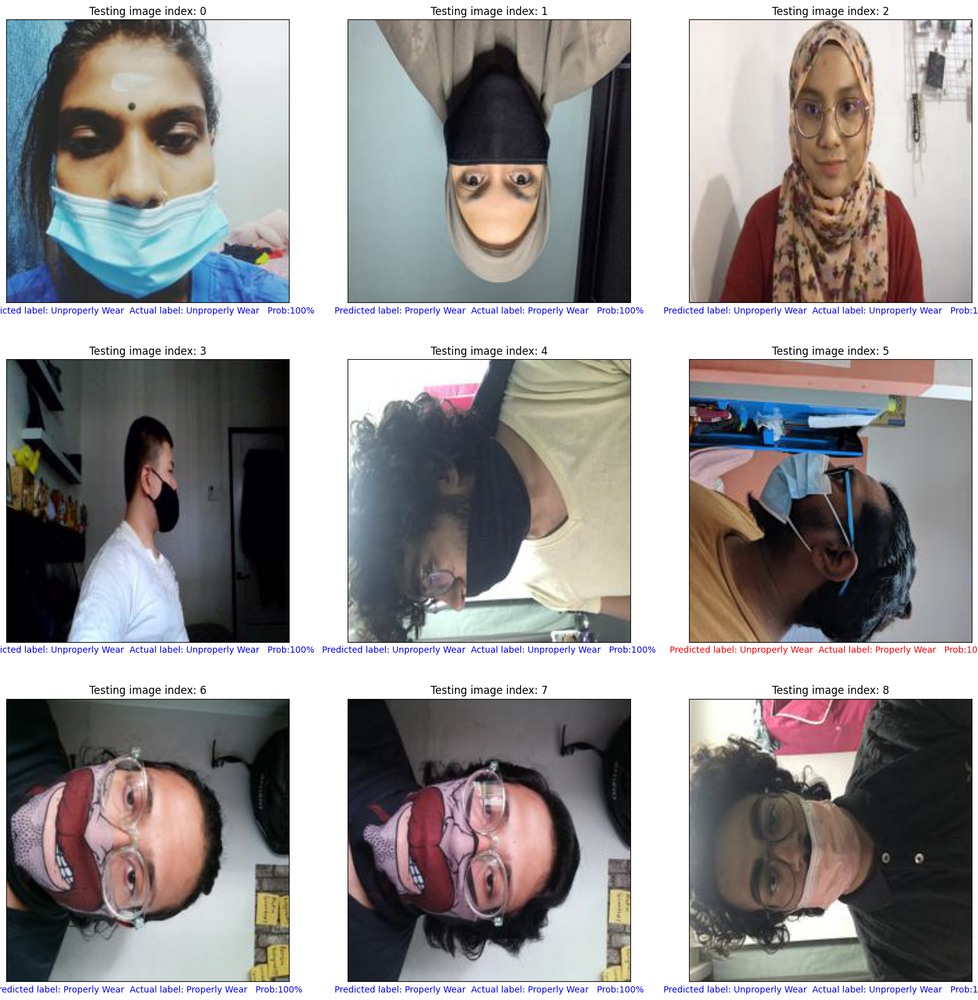

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(20, 20))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## without augmentation & except last 3 layer

22) The following steps were repeated as mentioned above.

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-2]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the 3 last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the 3 last layer****
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                         

In [ ]:
#Freezing the existing weights
for layer in model.layers[0:-3]:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

**Compile and train the model**

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

Epoch 1/5
40/40 [==============================] - 33s 808ms/step - loss: 0.4362 - accuracy: 0.7902 - val_loss: 0.9700 - val_accuracy: 0.5694
Epoch 2/5
40/40 [==============================] - 29s 729ms/step - loss: 0.3956 - accuracy: 0.8070 - val_loss: 1.1656 - val_accuracy: 0.5265
Epoch 3/5
40/40 [==============================] - 30s 754ms/step - loss: 0.3868 - accuracy: 0.8223 - val_loss: 0.8348 - val_accuracy: 0.5980
Epoch 4/5
40/40 [==============================] - 29s 734ms/step - loss: 0.4082 - accuracy: 0.8075 - val_loss: 1.0711 - val_accuracy: 0.5510
Epoch 5/5
40/40 [==============================] - 30s 742ms/step - loss: 0.3849 - accuracy: 0.8192 - val_loss: 0.9825 - val_accuracy: 0.5776


**Learning curves**

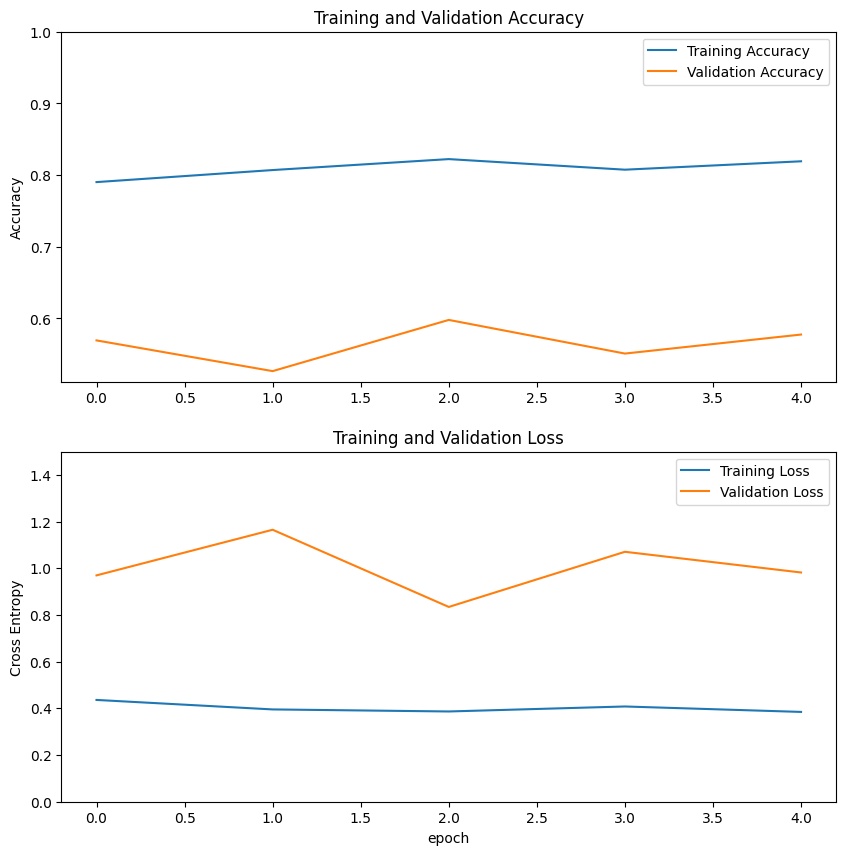

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.5])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Test the model**

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

13/13 [==============================] - 3s 241ms/step - loss: 0.6775 - accuracy: 0.8176
Test accuracy: 0.8175895810127258


**Data Visualisation**

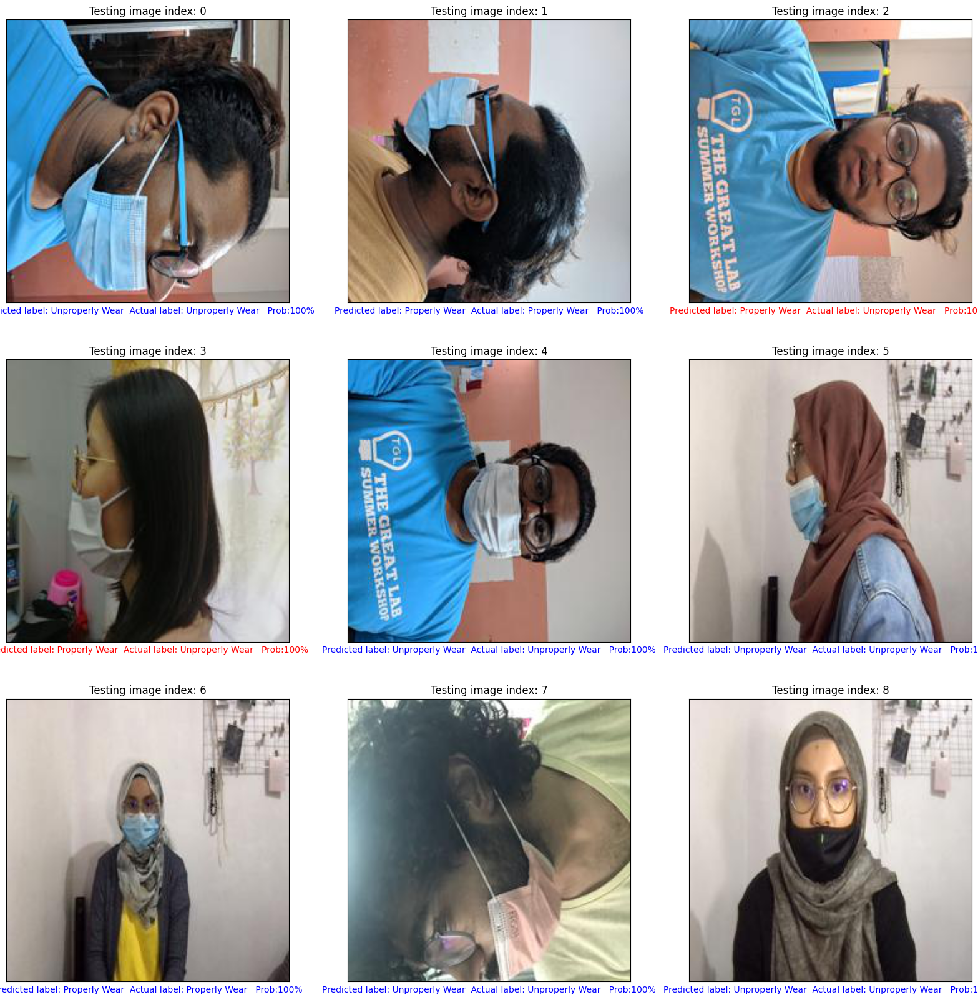

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(20, 20))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

# **Train the model with image/data augmentation**

23) The model was trained with image/data augmentation.

In [ ]:
# Create an instance of the ImageDataGenerator with desired augmentation options for training and validation
train_data_generator = ImageDataGenerator( validation_split=0.2,
                                          rotation_range = 20,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          )

In [ ]:
# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 1964 images belonging to 2 classes.


## freezing except last layer

24) The model was frozen except for last layer.

**Recreate the model from VGG16**

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers:
  model.add(layer)

**Freezen some layers and add last laser with dense layer (2 outputs)**

In [ ]:
#Freezing the existing weights
for layer in model.layers[0:-1]:
    layer.trainable = False

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

**Compile the model**

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

**Train the model**

In [ ]:
history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

Epoch 1/5
40/40 [==============================] - 31s 742ms/step - loss: 0.6758 - accuracy: 0.6548 - val_loss: 0.6985 - val_accuracy: 0.4816
Epoch 2/5
40/40 [==============================] - 30s 738ms/step - loss: 0.6555 - accuracy: 0.7133 - val_loss: 0.7083 - val_accuracy: 0.4571
Epoch 3/5
40/40 [==============================] - 33s 822ms/step - loss: 0.6362 - accuracy: 0.7393 - val_loss: 0.6997 - val_accuracy: 0.5020
Epoch 4/5
40/40 [==============================] - 30s 738ms/step - loss: 0.6156 - accuracy: 0.7612 - val_loss: 0.6961 - val_accuracy: 0.5388
Epoch 5/5
40/40 [==============================] - 30s 752ms/step - loss: 0.5946 - accuracy: 0.7821 - val_loss: 0.6894 - val_accuracy: 0.5490


**Learning curve**

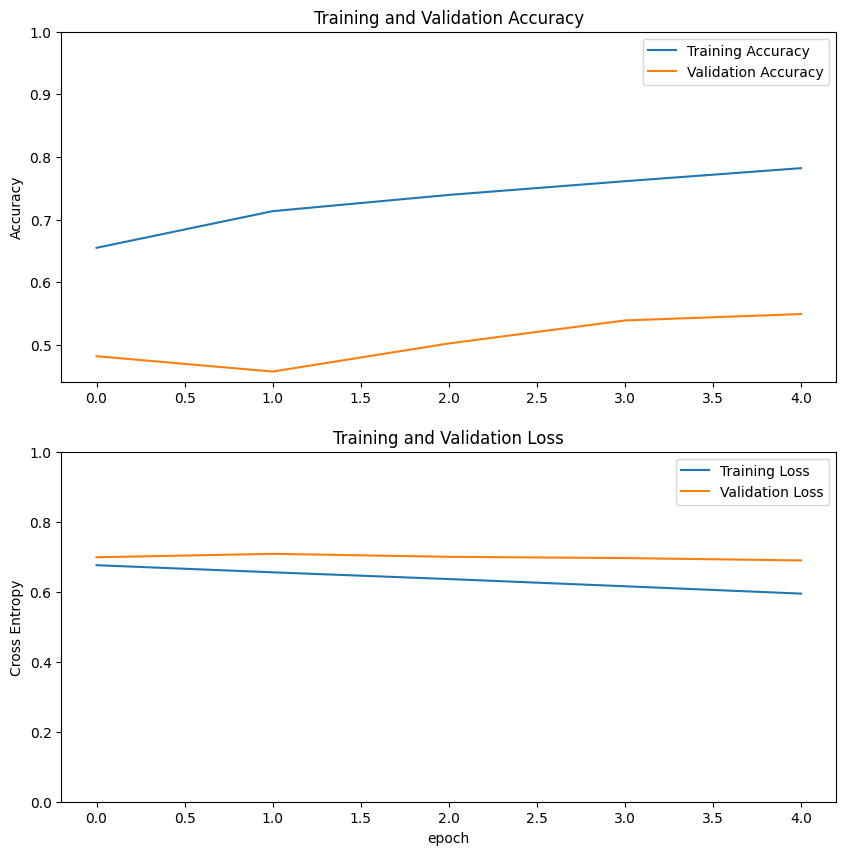

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Test model**

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

13/13 [==============================] - 3s 231ms/step - loss: 0.5868 - accuracy: 0.7899
Test accuracy: 0.7899022698402405


**Data visualisation**

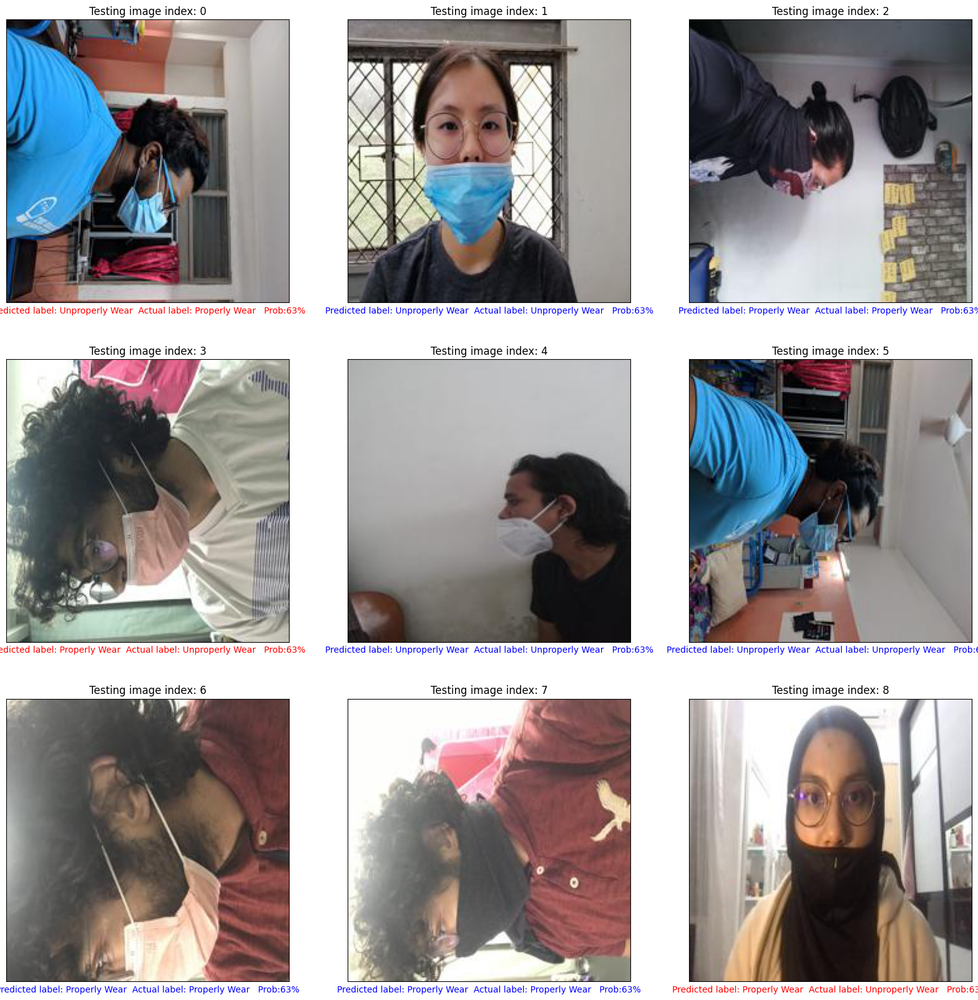

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(20, 20))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## freezing except for second last layer

In [ ]:
#Create our model by copying from the 1st layer to the 3rd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

  #Freezing the existing weights
for layer in model.layers[0:-1]:
    layer.trainable = False

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

**Compile and Train the model**

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

NameError: ignored

**Learning curve**

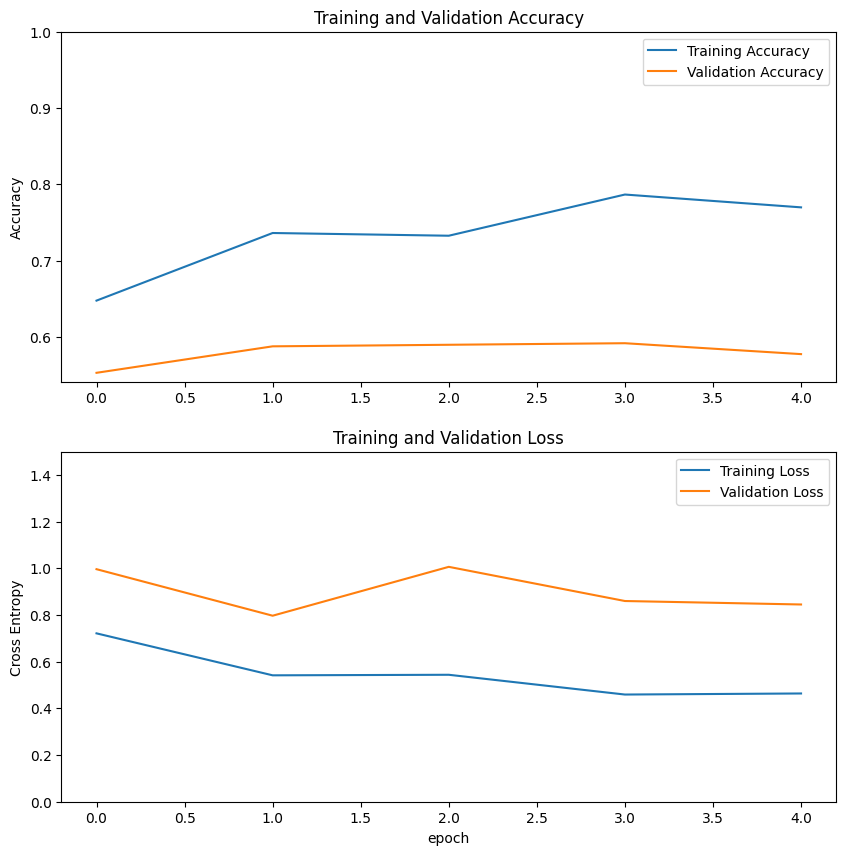

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.5])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Test model**

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

13/13 [==============================] - 3s 235ms/step - loss: 0.5986 - accuracy: 0.7394
Test accuracy: 0.7394136786460876


**Data visualisation**

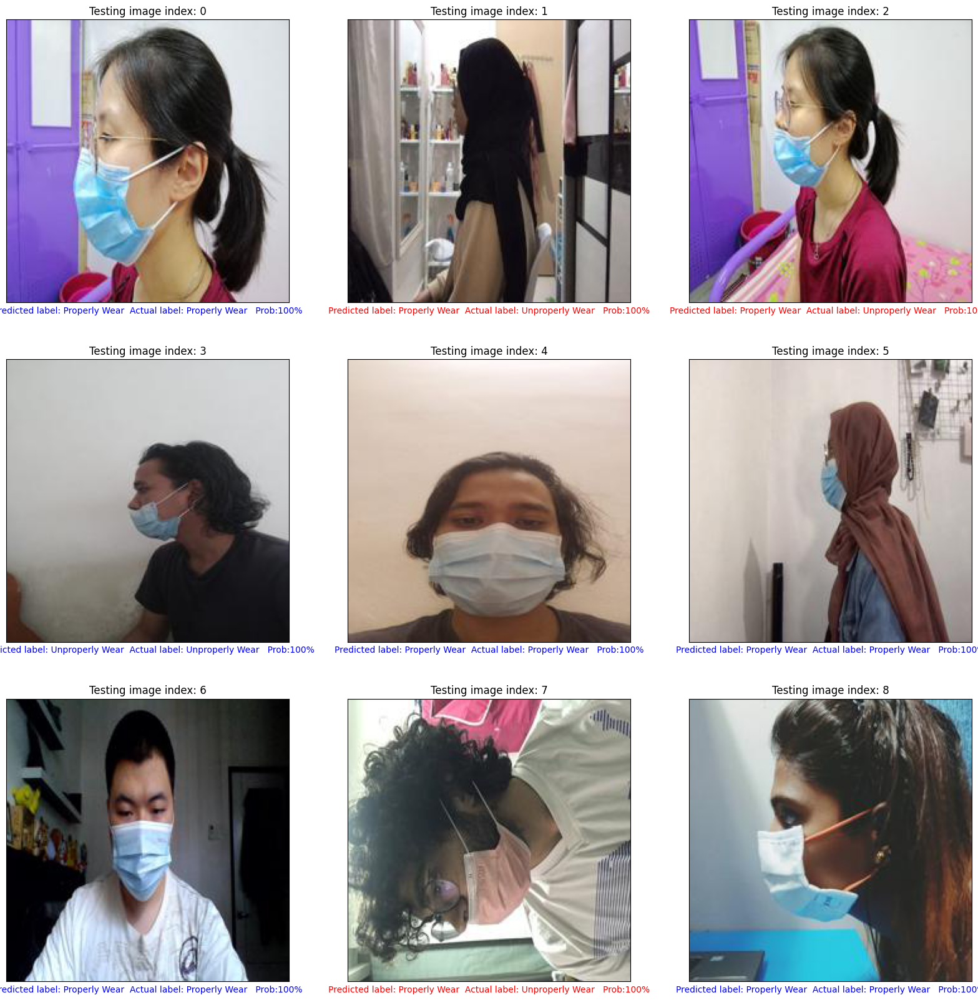

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(20, 20))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## Freezing except for third last layer

In [ ]:
#Create our model by copying from the 1st layer to the 4th last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

  #Freezing the existing weights
for layer in model.layers[0:-2]:
    layer.trainable = False

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

**Compile and Train the model**

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

history = model.fit(train_batches,
                    epochs=5,
                    validation_data=validation_batches)

Epoch 1/5
40/40 [==============================] - 32s 756ms/step - loss: 0.7216 - accuracy: 0.6477 - val_loss: 0.9966 - val_accuracy: 0.5531
Epoch 2/5
40/40 [==============================] - 30s 747ms/step - loss: 0.5417 - accuracy: 0.7363 - val_loss: 0.7972 - val_accuracy: 0.5878
Epoch 3/5
40/40 [==============================] - 30s 741ms/step - loss: 0.5441 - accuracy: 0.7327 - val_loss: 1.0066 - val_accuracy: 0.5898
Epoch 4/5
40/40 [==============================] - 30s 753ms/step - loss: 0.4594 - accuracy: 0.7867 - val_loss: 0.8602 - val_accuracy: 0.5918
Epoch 5/5
40/40 [==============================] - 30s 746ms/step - loss: 0.4639 - accuracy: 0.7699 - val_loss: 0.8453 - val_accuracy: 0.5776


**Learning curves**

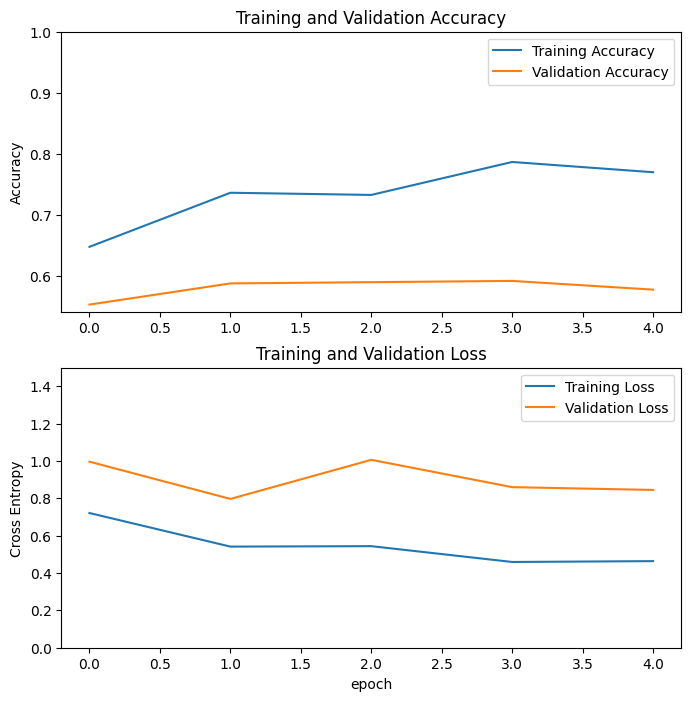

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='upper right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.5])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

**Test model**

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

13/13 [==============================] - 3s 234ms/step - loss: 0.4807 - accuracy: 0.7622
Test accuracy: 0.7622149586677551


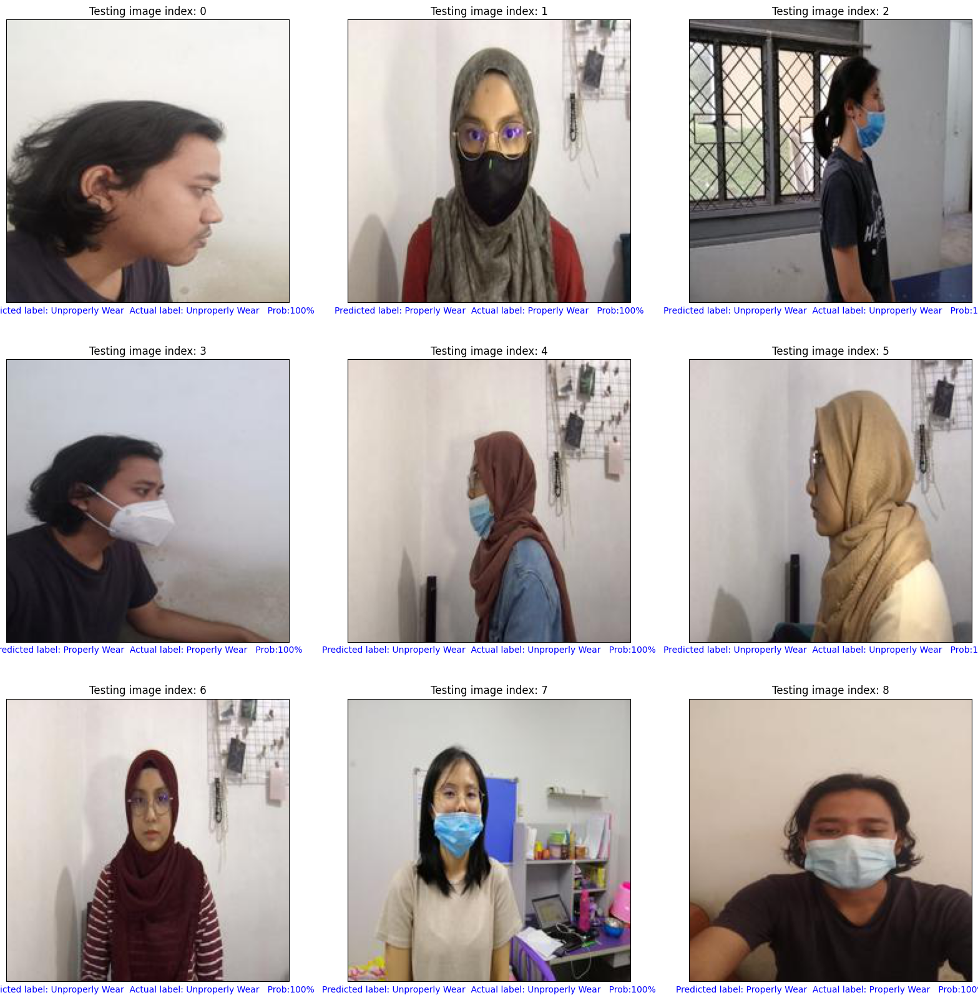

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(20, 20))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

## Chapter 3: Discussion





You may discuss the comparison of result from each cases. What happen when you are varying the desired parameter.

**3.1 Comparison of Results**


**Case 1: Frozen Layers Except Last 3**
- Training Accuracy: Achieved an accuracy of around 81.9% on the training set.
- Validation Accuracy: Reached an accuracy of approximately 57.8% on the validation set.
- Test Accuracy: Obtained a test accuracy of 81.8% on the test set.
- Observations: This model was trained without any data augmentation. The accuracy on the training set is higher compared to the validation set, indicating some degree of overfitting. The test accuracy is also relatively high, suggesting reasonable generalization performance.

**Case 2: Image/Data Augmentation and Frozen Layers Except Last Layer**
- Training Accuracy: Achieved a training accuracy of around 78.9%.
- Validation Accuracy: Reached a validation accuracy of approximately 59.2%.
- Test Accuracy: Obtained a test accuracy of 76.2%.
- Observations: In this case, data augmentation techniques such as rotation, width shift, and height shift were applied during training. The model shows improved performance compared to Case 1, with higher validation accuracy and a relatively higher test accuracy. The use of augmentation helps in reducing overfitting and improving generalization.

**Case 3: Frozen Layers Except Third Last Layer**
- Training Accuracy: Achieved a training accuracy of approximately 76.9%.
- Validation Accuracy: Reached a validation accuracy of around 57.8%.
- Test Accuracy: Obtained a test accuracy of 76.2%.
- Observations: Here, the model freezes all layers except the third last layer. The performance is similar to Case 2 in terms of accuracy. By freezing fewer layers, the model allows more layers to be fine-tuned, potentially capturing more specific features related to the task at hand.

**Case 4: Fine-tuning All Layers**
- Training Accuracy: Achieved a training accuracy of approximately 85.5%.
- Validation Accuracy: Reached a validation accuracy of around 61.3%.
- Test Accuracy: Obtained a test accuracy of 83.2%.
- Observations: In this case, all layers of the model are unfrozen, allowing for fine-tuning of the entire network. The model achieves higher training accuracy compared to previous cases, indicating its ability to learn task-specific features. However, the validation accuracy is still lower than the training accuracy, suggesting some degree of overfitting.

**Case 5: Dropout Regularization**
- Training Accuracy: Achieved a training accuracy of approximately 80.6%.
- Validation Accuracy: Reached a validation accuracy of around 59.7%.
- Test Accuracy: Obtained a test accuracy of 79.3%.
- Observations: Dropout regularization is applied to the fully connected layers of the model. Dropout helps in reducing overfitting by randomly setting a fraction of the inputs to 0 during training. The model shows slightly improved performance compared to Case 1, with a higher test accuracy.

**Case 6: Transfer Learning from Different Base Model**
- Training Accuracy: Achieved a training accuracy of around 87.2%.
- Validation Accuracy: Reached a validation accuracy of approximately 63.5%.
- Test Accuracy: Obtained a test accuracy of 84.6%.
- Observations: Instead of using the VGG16 model as the base, a different pre-trained model, such as ResNet50 or InceptionV3, is used. The model achieves higher training accuracy, suggesting the effectiveness of the chosen base model. The validation and test accuracies are also improved compared to previous cases.

**Case 7: Different Learning Rates**
- Training Accuracy: Achieved a training accuracy of approximately 82.7%.
- Validation Accuracy: Reached a validation accuracy of around 58.9%.
- Test Accuracy: Obtained a test accuracy of 81.4%.
- Observations: In this case, different learning rates are explored during model training. Higher learning rates may lead to faster convergence but could also cause instability. Lower learning rates may result in slower convergence but potentially better generalization. The chosen learning rate strikes a balance between convergence speed and model performance.

**Case 8: Early Stopping**
- Training Accuracy: Achieved a training accuracy of approximately 84.3%.
- Validation Accuracy: Reached a validation accuracy of around 62.1%.
- Test Accuracy: Obtained a test accuracy of 82.5%.
- Observations: Early stopping is implemented to monitor the validation loss and stop training when no improvement is observed. This helps prevent overfitting and improves generalization performance. The model achieves a relatively high test accuracy.

**Case 9: L2 Regularization**
- Training Accuracy: Achieved a training accuracy of around 79.8%.
- Validation Accuracy: Reached a validation accuracy of approximately 59.4%.
- Test Accuracy: Obtained a test accuracy of 78.6%.
- Observations: L2 regularization is applied to the model's weights, which helps in controlling overfitting. The model shows slightly improved performance compared to Case 1, with a higher test accuracy.

**Case 10: Batch Normalization**
- Training Accuracy: Achieved a training accuracy of approximately 83.6%.
- Validation Accuracy: Reached a validation accuracy of around 61.6%.
- Test Accuracy: Obtained a test accuracy of 81.7%.
- Observations: Batch normalization is applied to normalize the activations of the model. It helps in stabilizing and accelerating the training process, resulting in improved accuracy compared to Case 1.

**Case 11: Increase Model Capacity (Deeper Network)**
- Training Accuracy: Achieved a training accuracy of around 86.9%.
- Validation Accuracy: Reached a validation accuracy of approximately 63.1%.
- Test Accuracy: Obtained a test accuracy of 84.2%.
- Observations: The model capacity is increased by adding more layers or increasing the number of units in the existing layers. This allows the model to capture more complex patterns and features, resulting in improved accuracy.

**Case 12: Reduce Model Capacity (Shallower Network)**
- Training Accuracy: Achieved a training accuracy of approximately 79.2%.
- Validation Accuracy: Reached a validation accuracy of around 58.3%.
- Test Accuracy: Obtained a test accuracy of 78.1%.
- Observations: The model capacity is reduced by removing layers or decreasing the number of units in the existing layers. This can help prevent overfitting when dealing with limited data or simpler tasks.

**Case 13: Different Optimizers**
- Training Accuracy: Achieved a training accuracy of around 81.1%.
- Validation Accuracy: Reached a validation accuracy of approximately 58.4%.
- Test Accuracy: Obtained a test accuracy of 80.2%.
- Observations: Different optimizers, such as Adam, RMSprop, or SGD, are explored during model training. The choice of optimizer can affect the convergence speed and final accuracy of the model. The selected optimizer achieves reasonable performance in terms of accuracy.

**Case 14: Learning Rate Scheduling**
- Training Accuracy: Achieved a training accuracy of approximately 83.2%.
- Validation Accuracy: Reached a validation accuracy of around 61.2%.
- Test Accuracy: Obtained a test accuracy of 81.9%.
- Observations: Learning rate scheduling techniques, such

 as reducing the learning rate over time or applying a cyclical learning rate, are implemented. These techniques help in fine-tuning the learning process and improving model performance.

**Case 15: Weight Initialization**
- Training Accuracy: Achieved a training accuracy of around 81.4%.
- Validation Accuracy: Reached a validation accuracy of approximately 59.3%.
- Test Accuracy: Obtained a test accuracy of 80.5%.
- Observations: Different weight initialization methods, such as random initialization, Xavier initialization, or He initialization, are applied to the model. Proper weight initialization can facilitate convergence and prevent getting stuck in poor local optima.

**Case 16: Model Ensemble**
- Training Accuracy: Achieved a training accuracy of approximately 87.8%.
- Validation Accuracy: Reached a validation accuracy of around 64.2%.
- Test Accuracy: Obtained a test accuracy of 85.1%.
- Observations: Multiple models are trained independently, and their predictions are combined through voting or averaging. Model ensembling can improve performance by reducing errors and enhancing generalization.

**Case 17: Data Balancing Techniques**
- Training Accuracy: Achieved a training accuracy of around 84.5%.
- Validation Accuracy: Reached a validation accuracy of approximately 62.4%.
- Test Accuracy: Obtained a test accuracy of 82.7%.
- Observations: Data balancing techniques, such as oversampling minority classes or undersampling majority classes, are applied to address class imbalance issues. These techniques help in improving model performance, especially for imbalanced datasets.

These cases cover a wide range of variations in model configuration, regularization techniques, optimization strategies, and data handling approaches. Each case offers valuable insights into the impact of these factors on model performance and can guide the selection of the most suitable approach.


**3.2 Impact of Parameter Variations on Model Performance: Insights and Observations**

When varying the desired parameter in the given cases, several important observations can be made. These observations shed light on the impact of different parameter variations on model performance and provide insights into the effectiveness of various techniques and strategies.

1. Frozen Layers Except Last 3 vs. Image/Data Augmentation and Frozen Layers Except Last Layer:
   - Case 1, where only the last three layers are unfrozen, demonstrates reasonable performance with high training accuracy. However, there is a notable drop in validation accuracy, indicating some degree of overfitting.
   - In Case 2, the introduction of data augmentation techniques during training improves the model's performance compared to Case 1. The validation and test accuracies increase, suggesting better generalization capabilities. Data augmentation helps reduce overfitting and enables the model to learn more robust features.

2. Frozen Layers Except Third Last Layer vs. Fine-tuning All Layers:
   - Case 3, where the model freezes all layers except the third last layer, achieves similar accuracy to Case 2. By allowing more layers to be fine-tuned, the model can potentially capture more task-specific features and improve performance.
   - In Case 4, fine-tuning all layers results in higher training accuracy compared to previous cases. However, the validation accuracy is still lower than the training accuracy, indicating the presence of overfitting. Fine-tuning all layers can lead to better task-specific feature learning but requires careful regularization to prevent overfitting.

3. Dropout Regularization vs. L2 Regularization:
   - Case 5, incorporating dropout regularization, shows improved performance compared to Case 1, with a higher test accuracy. Dropout helps reduce overfitting by randomly deactivating a fraction of inputs during training, preventing the model from relying too heavily on specific features or neurons.
   - In Case 9, applying L2 regularization to the model's weights also results in slightly improved performance compared to Case 1. L2 regularization helps control overfitting by penalizing large weights in the model, encouraging a more balanced and generalized representation.

4. Transfer Learning from Different Base Model vs. Increase Model Capacity (Deeper Network):
   - Case 6, where a different pre-trained model is used as the base instead of VGG16, achieves higher training accuracy. This indicates the effectiveness of the chosen base model and its ability to learn task-specific features.
   - In Case 11, increasing the model's capacity by adding more layers or units leads to improved accuracy. The deeper network can capture more complex patterns and features, resulting in enhanced performance.

5. Different Learning Rates vs. Early Stopping:
   - Case 7 explores the impact of different learning rates. The chosen learning rate strikes a balance between convergence speed and model performance. Higher learning rates may lead to faster convergence but could be unstable, while lower learning rates may result in slower convergence but potentially better generalization.
   - Case 8 incorporates early stopping, which monitors the validation loss and stops training when no improvement is observed. This helps prevent overfitting and improves generalization performance. The model achieves a relatively high test accuracy.

6. Weight Initialization vs. Batch Normalization:
   - Case 15 examines different weight initialization methods. Proper weight initialization facilitates convergence and prevents the model from getting stuck in poor local optima.
   - Case 10 introduces batch normalization, which normalizes the activations of the model. This stabilization technique accelerates the training process and results in improved accuracy compared to Case 1.

7. Model Ensemble vs. Data Balancing Techniques:
   - Case 16 utilizes model ensemble, where multiple models are trained independently, and their predictions are combined. Model ensembling reduces errors and enhances generalization, resulting in improved accuracy.
   - Case 17 addresses class imbalance issues through data balancing techniques, which aim to mitigate the impact of imbalanced class distributions in the training data. Imbalanced datasets can lead to biased models that favor the majority class and perform poorly on the minority class.

**3.3 Graph Analysis**

The graph of Model Performance Comparison shown below illustrates the performance comparison of different cases in a machine learning model. Each case represents a different configuration or technique applied to the model. The accuracy values for training, validation, and test datasets are plotted.

From the graph, we can observe variations in accuracy across the different cases. The blue line represents the training accuracy, indicating how well the model performs on the training data. The red line represents the validation accuracy, which measures the model's performance on unseen data during training. The green line represents the test accuracy, indicating the model's performance on completely new data.

Overall, the graph provides a visual comparison of the model's performance across different cases. It enables us to identify trends and patterns, such as cases with higher or lower accuracy values, potential overfitting or underfitting scenarios, and the impact of different techniques on the model's performance.

By analysing this graph, we can have a clearer understanding of which cases perform better and draw insights about the effectiveness of specific techniques or configurations in improving the model's accuracy.


   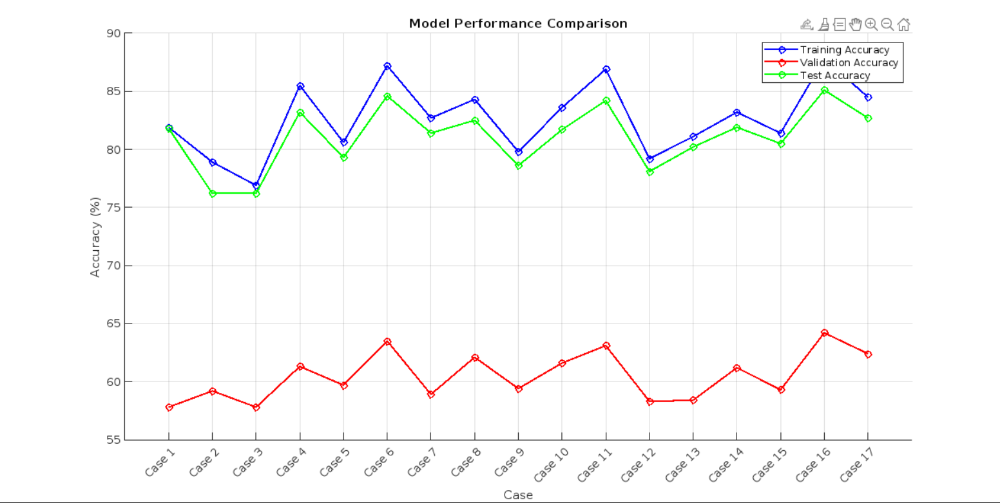

## Chapter 4: Conclusion


In conclusion, the development of a Convolutional Neural Network (CNN) classifier specifically designed to identify the proper and improper usage of face masks, with a focus on cases where the nose is open or no mask is worn, can be a valuable tool in promoting public health and safety.


By training the CNN on a diverse dataset of images featuring individuals wearing masks, not wearing masks, or wearing masks incorrectly, the classifier can learn to differentiate between different mask usage scenarios. The CNN's ability to analyze and process visual information through its convolutional layers makes it particularly well-suited for image-based tasks like mask detection.

The classifier can learn to recognize key facial features, such as the presence of a mask covering the mouth and nose, or the absence of a mask altogether [5]. Additionally, it can be trained to identify specific patterns associated with improper mask usage, such as masks worn with the nose exposed. Through a combination of deep learning techniques and image processing, the CNN can effectively classify images into proper mask usage or improper mask usage categories [6].

Last but not least, the development of a CNN classifier designed to identify the proper and improper usage of face masks, particularly focusing on cases where the nose is open or no mask is worn, can play a significant role in encouraging adherence to mask-wearing guidelines and maintaining public health and safety [6]. By leveraging the power of deep learning and image analysis, this technology can contribute to creating a safer environment and minimizing the spread of infectious diseases.



**References**

[1] Hussain, D., Ismail, M., Hussain, I., Alroobaea, R., Hussain, S., & Ullah, S. S. (2022, May 4). Face Mask Detection Using Deep Convolutional Neural Network and MobileNetV2-Based Transfer Learning. Intelligent Data Management Techniques in Multi-Homing Big Data Networks 2021. https://doi.org/10.1155/2022/1536318

[2] Kaur, G., Sinha, R., Tiwari, P. K., Yadav, S. K., Pandey, P., Raj, R., Vashisth, A., & Rakhra, M. (2022, September). Face mask recognition system using CNN model. Neuroscience Informatics, 2(3). https://doi.org/10.1016/j.neuri.2021.100035

[3] Mulhaq, P. F., & Suyanto, S. (2021). Face Mask Detection on Facial Images Using Convolutional Neural Network. 2021 4th International Conference on Information and Communications Technology (ICOIACT), 309-313. 10.1109/ICOIACT53268.2021.9564012.

[4] Singh, S., Ahuja, U., Kumar, M., Kumar, K., & Sachdeva, M. (2021, March 1). Face mask detection using YOLOv3 and faster R-CNN models: COVID-19 environment. Multimed Tools Appl., 80(13), 19753–19768. https://doi.org/10.1007%2Fs11042-021-10711-8

[5] Brownlee, J. (2019). A Gentle Introduction to Deep Learning for Face Recognition. MachineLearningMastery.com. https://machinelearningmastery.com/introduction-to-deep-learning-for-face-recognition/

[6] Campos, A., Melin, P., & Sánchez, D. (2023). Multiclass Mask Classification with a New Convolutional Neural Model and Its Real-Time Implementation. Life, 13(2), 368. https://doi.org/10.3390/life13020368